## Librari yang Digunakan

In [ ]:
# Library dasar
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Mengabaikan peringatan agar output lebih bersih
import warnings
warnings.filterwarnings('ignore')

# Metrics dari scikit-learn untuk evaluasi model
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score

# TensorFlow & Keras (Deep Learning)
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout

#### Mengimpor library dasar untuk pengelolaan data dan visualisasi, mengabaikan warning agar output bersih, memuat fungsi evaluasi dari scikit-learn, serta mengimpor modul TensorFlow/Keras yang digunakan untuk membangun, melatih, dan mengevaluasi model CNN menggunakan arsitektur MobileNetV2.

## Folder Dataset

In [8]:
train_dir = "Vegetable Images/train"
val_dir = "Vegetable Images/validation"
test_dir = "Vegetable Images/test"

#### Folder berisi data training, validasi dan testing

## Preprocessing Dataset

In [ ]:
# Training data generator dengan augmentasi
train_gen = ImageDataGenerator(
    rescale=1./255,               # Menormalisasi nilai piksel menjadi rentang [0, 1]
    rotation_range=30,            # Rotasi acak hingga 30 derajat
    width_shift_range=0.2,        # Pergeseran gambar secara horizontal hingga 20%
    height_shift_range=0.2,       # Pergeseran gambar secara vertikal hingga 20%
    shear_range=0.2,              # Transformasi shear (kemiringan) secara acak
    zoom_range=0.2,               # Zoom acak hingga 20%
    horizontal_flip=True          # Membalik gambar secara horizontal secara acak
)

train_data = train_gen.flow_from_directory(
    train_dir,
    target_size=(224, 224),       # Mengubah ukuran semua gambar menjadi 224x224
    batch_size=32,                # Memproses 32 gambar per batch
    class_mode='categorical'      # Mode untuk klasifikasi multi-kelas
)

# Validation data generator
val_gen = ImageDataGenerator(rescale=1./255)  # Hanya melakukan normalisasi piksel

val_data = val_gen.flow_from_directory(
    val_dir,
    target_size=(224, 224),           # Ukuran gambar validasi 224x224
    batch_size=32,                    # Batch sebesar 32
    class_mode='categorical'          # Klasifikasi multi-kelas
)

# Test data generator 
test_gen = ImageDataGenerator(rescale=1./255)  # Normalisasi piksel untuk data uji

test_data = test_gen.flow_from_directory(
    test_dir,
    target_size=(224, 224),           # Ukuran gambar uji 224x224
    batch_size=32,                    # Batch sebesar 32
    class_mode='categorical',         # Mode klasifikasi multi-kelas
    shuffle=False                     # Tidak shuffle agar urutan prediksi konsisten
)


Found 15000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


#### Membuat data generator untuk memproses gambar sebelum masuk ke model. Data training diberi augmentasi seperti rotasi, pergeseran, zoom, dan flip untuk menambah variasi gambar, sedangkan data validasi dan testing hanya dinormalisasi dengan rescale tanpa augmentasi agar tetap konsisten. Semua gambar diubah ukurannya menjadi 224×224 dan dibaca sebagai data klasifikasi multi-kelas.

In [ ]:
def count_images_in_class(directory):        # Mendefinisikan fungsi untuk menghitung jumlah gambar pada setiap kelas
  class_counts = {}                          # Dictionary untuk menyimpan jumlah gambar per kelas
  for class_name in os.listdir(directory):   # Melakukan iterasi pada setiap nama folder (kelas) di dalam direktori
    class_dir = os.path.join(directory, class_name)  # Menggabungkan path direktori dengan nama kelas
    if os.path.isdir(class_dir):             # Memastikan bahwa path tersebut adalah folder
      class_counts[class_name] = len(os.listdir(class_dir))  # Menghitung jumlah file/gambar di dalam folder kelas
  return class_counts                        # Mengembalikan hasil perhitungan dalam bentuk dictionary

print("Counts in train directory:")          # Menampilkan judul untuk hasil perhitungan folder train
train_counts = count_images_in_class(train_dir)  # Memanggil fungsi dan menyimpan jumlah gambar train
for class_name, count in train_counts.items():    # Iterasi untuk menampilkan setiap kelas beserta jumlah gambarnya
  print(f"{class_name}: {count}")            # Menampilkan nama kelas dan jumlah gambar

print("\nCounts in validation directory:")   # Menampilkan judul untuk hasil validasi
val_counts = count_images_in_class(val_dir)  # Memanggil fungsi untuk folder validasi
for class_name, count in val_counts.items(): # Iterasi kelas di folder validasi
  print(f"{class_name}: {count}")            # Menampilkan hasilnya

print("\nCounts in test directory:")         # Menampilkan judul untuk data test
test_counts = count_images_in_class(test_dir) # Menghitung gambar di folder test
for class_name, count in test_counts.items(): # Iterasi untuk menampilkan jumlah gambar test per kelas
  print(f"{class_name}: {count}")            # Menampilkan nama kelas dan jumlahnya


Counts in train directory:
Bean: 1000
Bitter_Gourd: 1000
Bottle_Gourd: 1000
Brinjal: 1000
Broccoli: 1000
Cabbage: 1000
Capsicum: 1000
Carrot: 1000
Cauliflower: 1000
Cucumber: 1000
Papaya: 1000
Potato: 1000
Pumpkin: 1000
Radish: 1000
Tomato: 1000

Counts in validation directory:
Bean: 200
Bitter_Gourd: 200
Bottle_Gourd: 200
Brinjal: 200
Broccoli: 200
Cabbage: 200
Capsicum: 200
Carrot: 200
Cauliflower: 200
Cucumber: 200
Papaya: 200
Potato: 200
Pumpkin: 200
Radish: 200
Tomato: 200

Counts in test directory:
Bean: 200
Bitter_Gourd: 200
Bottle_Gourd: 200
Brinjal: 200
Broccoli: 200
Cabbage: 200
Capsicum: 200
Carrot: 200
Cauliflower: 200
Cucumber: 200
Papaya: 200
Potato: 200
Pumpkin: 200
Radish: 200
Tomato: 200


#### Membuat fungsi untuk menghitung jumlah gambar pada setiap kelas di dalam folder dataset. Fungsi membaca semua subfolder dalam direktori (train, validation, dan test), kemudian menghitung berapa banyak file gambar di masing-masing kelas. Hasilnya dicetak agar bisa melihat distribusi dataset per kelas.

In [ ]:
data = pd.DataFrame({                          # Membuat DataFrame untuk menggabungkan jumlah gambar
    'train': pd.Series(train_counts),          # Kolom berisi jumlah gambar dari folder train
    'validation': pd.Series(val_counts),       # Kolom berisi jumlah gambar dari folder validation
    'test': pd.Series(test_counts)             # Kolom berisi jumlah gambar dari folder test
})

print("\nCounts in a single DataFrame:")        # Menampilkan judul output
data                                           # Menampilkan DataFrame yang telah dibuat



Counts in a single DataFrame:


,train,validation,test
Bean,1000,200,200
Bitter_Gourd,1000,200,200
Bottle_Gourd,1000,200,200
Brinjal,1000,200,200
Broccoli,1000,200,200
Cabbage,1000,200,200
Capsicum,1000,200,200
Carrot,1000,200,200
Cauliflower,1000,200,200
Cucumber,1000,200,200


#### Menyatukan jumlah gambar per kelas dari train, validation, dan test ke dalam satu tabel (DataFrame) sehingga distribusi dataset dapat dilihat secara lebih rapi dan terstruktur.

## Visualisasi Contoh Dataset

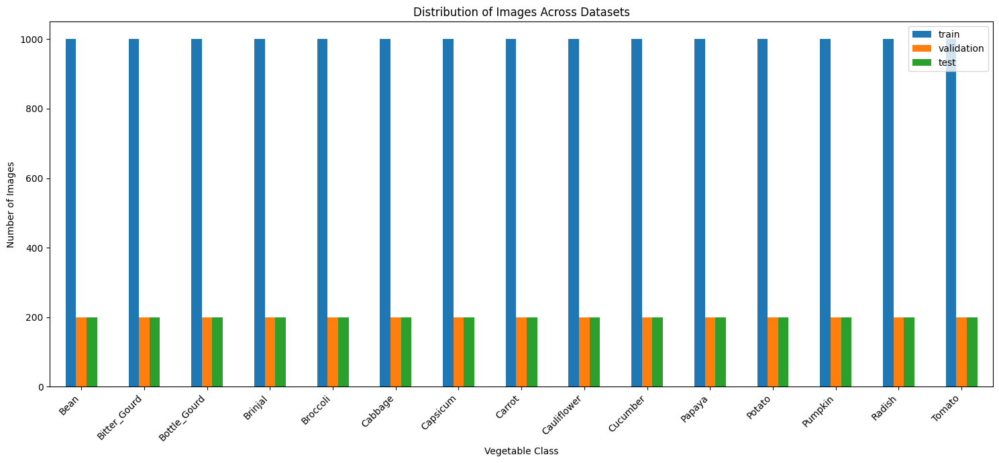

In [ ]:
data.plot(kind='bar', figsize=(15, 7))          # Membuat grafik batang (bar chart) dengan ukuran 15x7
plt.title('Distribution of Images Across Datasets')  # Memberikan judul pada grafik
plt.xlabel('Vegetable Class')                   # Memberikan label pada sumbu X
plt.ylabel('Number of Images')                  # Memberikan label pada sumbu Y
plt.xticks(rotation=45, ha='right')             # Memutar label sumbu X sebesar 45 derajat agar terbaca jelas
plt.tight_layout()                              # Mengatur layout agar elemen grafik tidak saling tumpang tindih
plt.show()                                      # Menampilkan grafik


#### Menampilkan grafik batang yang menunjukkan jumlah gambar di setiap kelas untuk dataset train, validation, dan test.

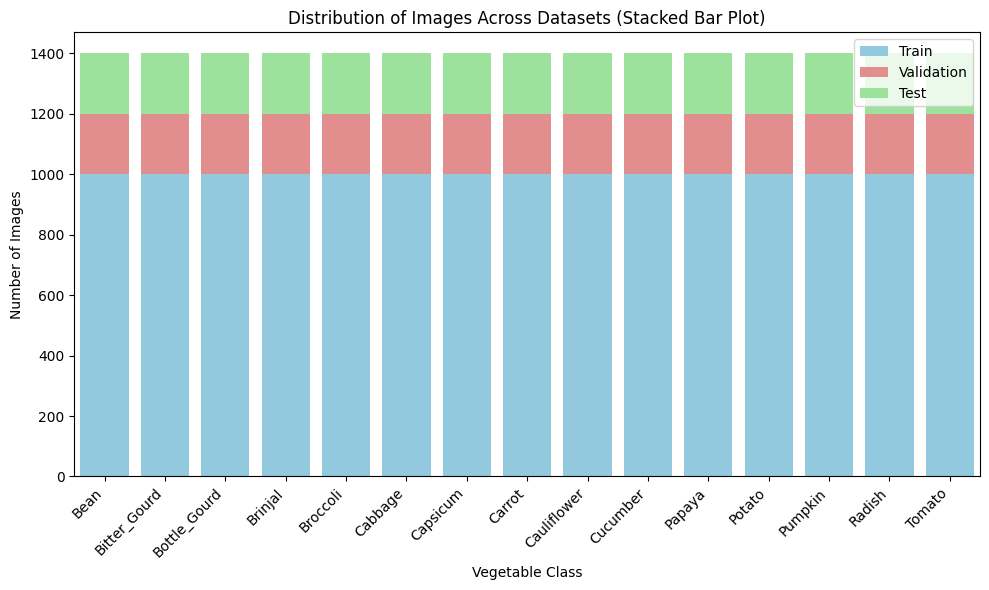

In [ ]:
plt.figure(figsize=(10, 6))  
# Membuat figure/gambar baru dengan ukuran 10x6

sns.barplot(x=data.index, y='train', data=data, color='skyblue', label='Train')  
# Membuat barplot pertama untuk dataset train

sns.barplot(x=data.index, y='validation', data=data, color='lightcoral', label='Validation', bottom=data['train'])  
# Membuat barplot kedua (stacked) di atas bar train dengan menambahkan parameter bottom

sns.barplot(x=data.index, y='test', data=data, color='lightgreen', label='Test', bottom=data['train'] + data['validation'])  
# Membuat barplot ketiga (stacked) di atas bar train + validation

plt.title('Distribution of Images Across Datasets (Stacked Bar Plot)')  
# Memberikan judul grafik

plt.xlabel('Vegetable Class')  
# Memberi label pada sumbu X

plt.ylabel('Number of Images')  
# Memberi label pada sumbu Y

plt.xticks(rotation=45, ha='right')  
# Memutar label kategori di sumbu X agar lebih mudah dibaca

plt.legend()  
# Menampilkan legenda untuk membedakan warna tiap dataset

plt.tight_layout()  
# Mengatur layout agar tidak ada elemen grafik yang terpotong

plt.show()  
# Menampilkan grafik


#### membuat grafik batang bertumpuk untuk memperlihatkan jumlah gambar pada setiap kelas dalam dataset train, validation, dan test secara sekaligus.

Displaying sample training images:


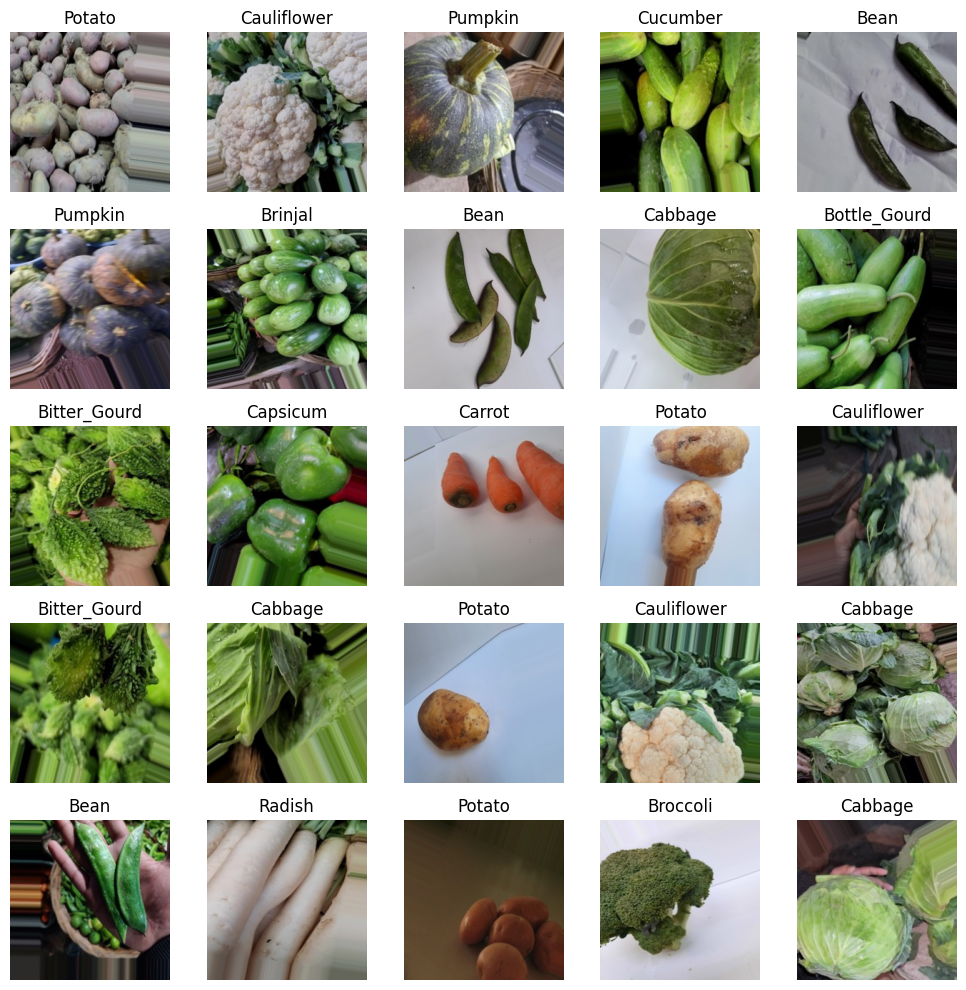


Displaying sample validation images:


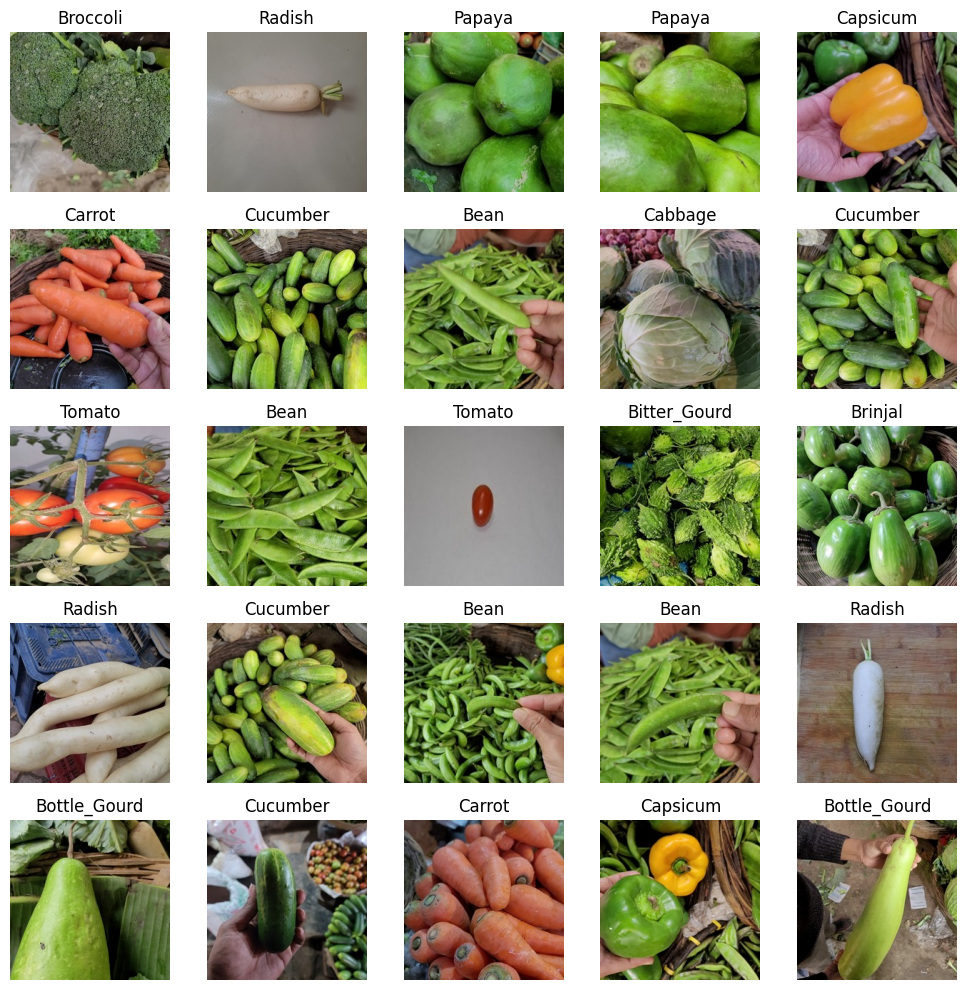


Displaying sample test images:


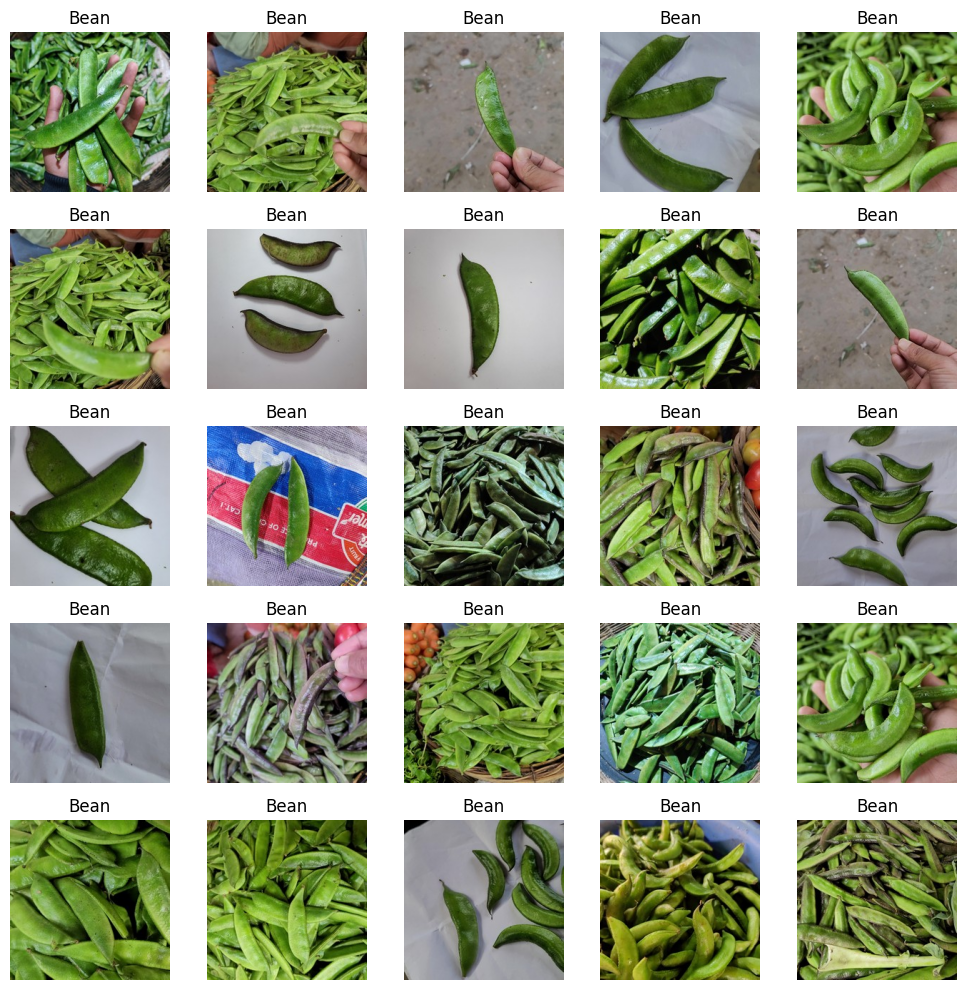

In [ ]:
def display_image_grid(data_generator, num_images=25):   # Fungsi untuk menampilkan grid berisi sampel gambar
  images, labels = next(data_generator)                  # Mengambil satu batch gambar dan label dari generator
  plt.figure(figsize=(10, 10))                           # Membuat canvas gambar dengan ukuran 10x10

  for i in range(num_images):                            # Loop untuk menampilkan sejumlah gambar
    plt.subplot(5, 5, i + 1)                             # Membuat subplot 5x5 sesuai urutan gambar
    plt.imshow(images[i])                                # Menampilkan gambar ke-i

    label_index = np.argmax(labels[i])                   # Mendapatkan indeks label dengan nilai terbesar (one-hot)
    class_name = list(data_generator.class_indices.keys())[   # Mencari nama kelas berdasarkan indeks label
        list(data_generator.class_indices.values()).index(label_index)
    ]
    plt.title(class_name)                                # Menampilkan nama kelas sebagai judul gambar
    plt.axis('off')                                      # Menonaktifkan axis agar tampilan lebih rapi

  plt.tight_layout()                                     # Merapikan tata letak subplot
  plt.show()                                             # Menampilkan grid gambar

print("Displaying sample training images:")               # Menampilkan teks informasi
display_image_grid(train_data)                           # Memanggil fungsi untuk dataset train

print("\nDisplaying sample validation images:")           # Menampilkan teks informasi
display_image_grid(val_data)                             # Memanggil fungsi untuk dataset validation

print("\nDisplaying sample test images:")                 # Menampilkan teks informasi
display_image_grid(test_data)                            # Memanggil fungsi untuk dataset test


#### menampilkan grid gambar contoh dari data generator untuk melihat sampel dataset secara visual. Setiap gambar diberi label kelasnya, sehingga memudahkan memeriksa apakah data sudah terbaca dengan benar dan apakah augmentasi bekerja sesuai harapan.

## Membangun dan Mengompilasi Model CNN (MobileNetV2)

In [ ]:
# 1. Muat Model Pra-terlatih (MobileNetV2)
base_model = MobileNetV2(
    input_shape=(224, 224, 3),     # Ukuran input gambar dan jumlah channel (RGB)
    include_top=False,             # Tidak menyertakan fully connected layer asli MobileNetV2
    weights='imagenet'             # Menggunakan bobot pretrained dari ImageNet
)

# 2. Bekukan bobot model dasar agar tidak ikut dilatih ulang
base_model.trainable = False       # Membuat semua layer pada base_model menjadi non-trainable

# 3. Bangun model baru di atas model dasar
model = Sequential([
    base_model,                    # Menambahkan MobileNetV2 sebagai bagian awal model
    GlobalAveragePooling2D(),      # Mengganti Flatten, merata-rata fitur secara global untuk efisiensi

    # Lapisan baru yang akan kita latih
    Dense(512, activation='relu'), # Fully connected layer dengan 512 neuron dan aktivasi ReLU
    Dropout(0.5),                  # Dropout 50% untuk mengurangi overfitting

    # Lapisan output
    Dense(15, activation='softmax')  # Output dengan 15 kelas menggunakan softmax
])

# 4. Kompilasi model
model.compile(
    optimizer='adam',                 # Optimizer Adam
    loss='categorical_crossentropy',  # Loss untuk klasifikasi multi-kelas
    metrics=['accuracy']              # Menggunakan metrik akurasi
)

model.summary()                       # Menampilkan arsitektur model secara lengkap


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 15)                  │           7,695 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,921,551 (11.14 MB)

 Trainable params: 663,567 (2.53 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

#### Membangun model CNN menggunakan MobileNetV2 sebagai base model pra-terlatih yang bobotnya dibekukan agar tidak ikut dilatih ulang. Di atasnya ditambahkan lapisan baru seperti GlobalAveragePooling2D, Dense, dan Dropout, lalu model dikompilasi menggunakan optimizer Adam dan loss categorical crossentropy.

## Training Model

In [ ]:
class MyCallback(tf.keras.callbacks.Callback):               # Membuat callback kustom dengan mewarisi class Callback
    def on_epoch_end(self, epoch, logs={}):                  # Fungsi yang dijalankan setiap akhir epoch
        if(logs.get('accuracy') > 0.98 and logs.get('val_accuracy') > 0.98):  
            # Jika akurasi training dan validation sama-sama > 98%
            self.model.stop_training = True                  # Hentikan proses training secara otomatis
            
early_stop = EarlyStopping(
    monitor='val_loss',      # Memantau nilai validation loss
    patience=5,              # Berhenti jika tidak ada perbaikan selama 5 epoch berturut-turut
    restore_best_weights=True  # Mengembalikan bobot model terbaik (val_loss terendah)
)

history = model.fit(
    train_data,              # Dataset training
    epochs=100,              # Melatih hingga maksimal 100 epoch
    validation_data=val_data,# Dataset validasi
    callbacks=[early_stop]   # Menggunakan callback EarlyStopping
)


Epoch 1/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 547s 1s/step - accuracy: 0.9387 - loss: 0.1999 - val_accuracy: 0.9930 - val_loss: 0.0200
Epoch 2/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 400s 852ms/step - accuracy: 0.9743 - loss: 0.0800 - val_accuracy: 0.9953 - val_loss: 0.0155
Epoch 3/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 403s 859ms/step - accuracy: 0.9825 - loss: 0.0573 - val_accuracy: 0.9950 - val_loss: 0.0163
Epoch 4/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 408s 870ms/step - accuracy: 0.9824 - loss: 0.0569 - val_accuracy: 0.9963 - val_loss: 0.0120
Epoch 5/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 468s 998ms/step - accuracy: 0.9836 - loss: 0.0514 - val_accuracy: 0.9993 - val_loss: 0.0042
Epoch 6/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 448s 956ms/step - accuracy: 0.9849 - loss: 0.0522 - val_accuracy: 0.9980 - val_loss: 0.0054
Epoch 7/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 424s 903ms/step - accuracy: 0.9871 - loss: 0.0428 - val_accuracy: 0.9990 - val_loss: 0.0057
Epoch 8/100
469/469 ━━━━━━━━━━━━━━━━━━━━ 414s 883ms/step - accuracy: 0.9

#### Menyiapkan callback untuk menghentikan pelatihan lebih awal jika performa tidak membaik, lalu menjalankan proses training model menggunakan data training dan validation hingga maksimal 100 epoch.

## Evaluasi Model

In [ ]:
loss, accuracy = model.evaluate(test_data)     # Mengevaluasi model menggunakan dataset test, menghasilkan nilai loss dan akurasi
print(f'Test Loss: {loss:.4f}')                # Menampilkan nilai loss dengan format 4 angka desimal
print(f'Test Accuracy: {accuracy *100:.2f}%')  # Menampilkan akurasi dalam persen dengan 2 angka desimal

94/94 ━━━━━━━━━━━━━━━━━━━━ 65s 690ms/step - accuracy: 0.9977 - loss: 0.0108
Test Loss: 0.0108
Test Accuracy: 99.77%


#### Melakukan evaluasi model pada dataset testing untuk mendapatkan nilai loss dan akurasi akhir setelah pelatihan selesai.

## Visualisasi Hasil Training

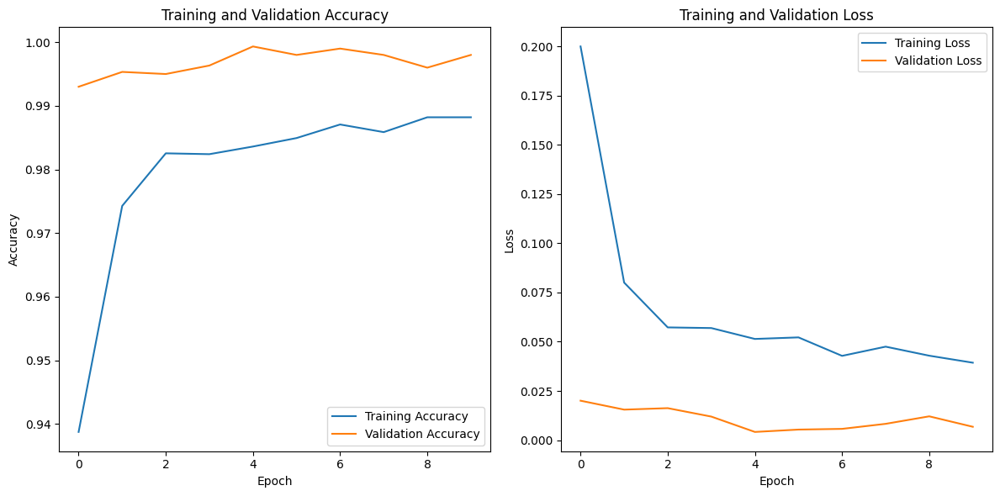

In [ ]:
plt.figure(figsize=(12, 6))  
# Membuat canvas figure dengan ukuran 12x6

# Plot training and validation accuracy
plt.subplot(1, 2, 1)  
# Membuat subplot pertama (baris 1, kolom 2, posisi 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')  
# Plot akurasi data training
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')  
# Plot akurasi data validasi
plt.title('Training and Validation Accuracy')  
# Judul grafik
plt.xlabel('Epoch')  
# Label sumbu X
plt.ylabel('Accuracy')  
# Label sumbu Y
plt.legend()  
# Menampilkan legenda

# Plot training and validation loss
plt.subplot(1, 2, 2)  
# Subplot kedua (posisi 2)
plt.plot(history.history['loss'], label='Training Loss')  
# Plot loss training
plt.plot(history.history['val_loss'], label='Validation Loss')  
# Plot loss validasi
plt.title('Training and Validation Loss')  
# Judul grafik
plt.xlabel('Epoch')  
# Label sumbu X
plt.ylabel('Loss')  
# Label sumbu Y
plt.legend()  
# Menampilkan legenda

plt.tight_layout()  
# Mengatur tata letak agar tidak bertumpuk
plt.show()  
# Menampilkan grafik


#### Grafik menunjukkan perubahan akurasi dan loss pada data latih serta validasi selama pelatihan untuk menilai peningkatan performa dan mendeteksi overfitting.

94/94 ━━━━━━━━━━━━━━━━━━━━ 50s 519ms/step


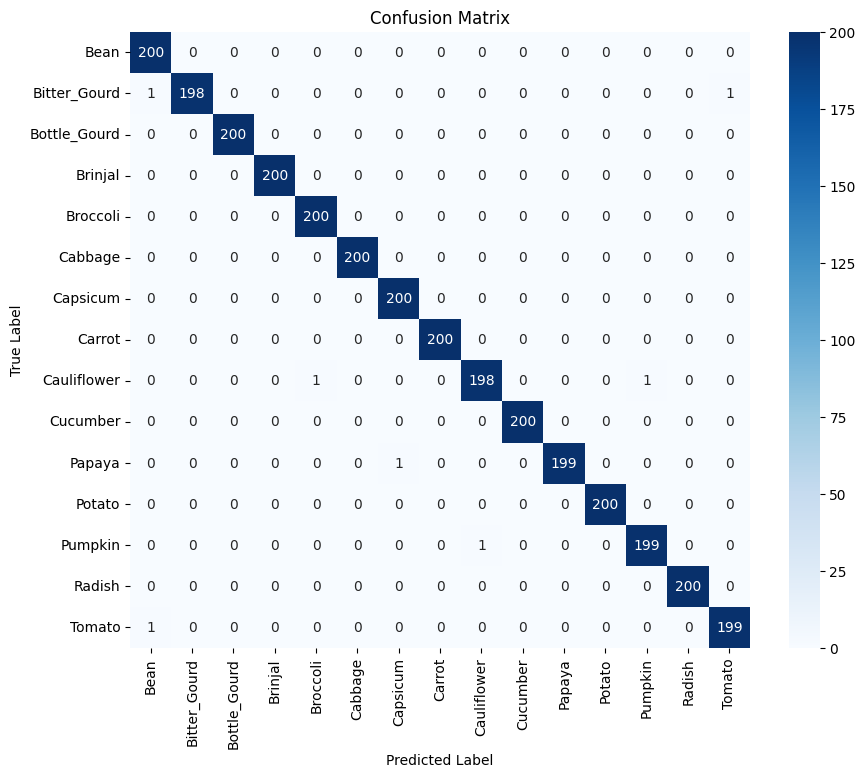

In [ ]:
true_labels = test_data.classes  
# Mengambil label asli dari dataset test (berbentuk angka indeks kelas)

predictions = model.predict(test_data)  
# Melakukan prediksi probabilitas untuk setiap kelas
predicted_labels = np.argmax(predictions, axis=1)  
# Mengambil label kelas dengan probabilitas tertinggi

class_labels = list(test_data.class_indices.keys())  
# Mendapatkan nama kelas berdasarkan urutannya

cm = confusion_matrix(true_labels, predicted_labels)  
# Membuat confusion matrix dari label asli dan label prediksi

plt.figure(figsize=(10, 8))  
# Membuat figure baru dengan ukuran 10x8
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_labels, yticklabels=class_labels)  
# Membuat heatmap confusion matrix, menampilkan angka, dan memberi label kelas
plt.xlabel('Predicted Label')  
# Label sumbu X
plt.ylabel('True Label')  
# Label sumbu Y
plt.title('Confusion Matrix')  
# Judul heatmap
plt.show()  
# Menampilkan hasil plot


#### Confusion matrix menunjukkan perbandingan antara label asli dan label yang diprediksi. Grafiknya memperlihatkan berapa banyak gambar yang benar dan salah diklasifikasi untuk tiap kelas.

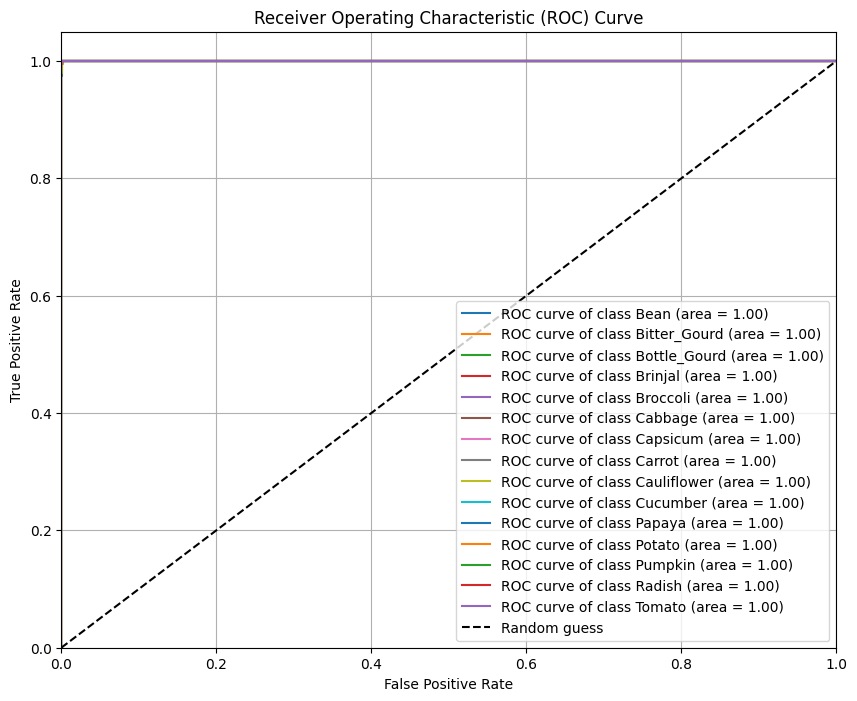

In [ ]:
fpr = dict()      # Dictionary untuk menyimpan nilai False Positive Rate per kelas
tpr = dict()      # Dictionary untuk menyimpan nilai True Positive Rate per kelas
roc_auc = dict()  # Dictionary untuk menyimpan nilai AUC (Area Under Curve) per kelas
n_classes = len(class_labels)  # Jumlah total kelas

for i in range(n_classes):
  # Get the true one-hot encoded labels
  true_one_hot = np.zeros((len(true_labels), n_classes))  
  # Membuat array kosong untuk one-hot encoding
  true_one_hot[np.arange(len(true_labels)), true_labels] = 1  
  # Mengonversi label asli menjadi format one-hot

  fpr[i], tpr[i], _ = roc_curve(true_one_hot[:, i], predictions[:, i])  
  # Menghitung FPR dan TPR untuk kelas ke-i
  roc_auc[i] = auc(fpr[i], tpr[i])  
  # Menghitung nilai AUC untuk kelas ke-i

plt.figure(figsize=(10, 8))  # Membuat figure baru berukuran 10x8
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i],
             label=f'ROC curve of class {class_labels[i]} (area = {roc_auc[i]:0.2f})')
    # Plot kurva ROC untuk setiap kelas dengan AUC ditampilkan

plt.plot([0, 1], [0, 1], 'k--', label='Random guess')  
# Garis diagonal sebagai baseline tebakan acak
plt.xlim([0.0, 1.0])   # Batas sumbu X
plt.ylim([0.0, 1.05])  # Batas sumbu Y
plt.xlabel('False Positive Rate')   # Label sumbu X
plt.ylabel('True Positive Rate')    # Label sumbu Y
plt.title('Receiver Operating Characteristic (ROC) Curve')  
# Judul grafik ROC
plt.legend(loc="lower right")  
# Menampilkan legenda di kanan bawah
plt.grid(True)  
# Mengaktifkan grid untuk memperjelas grafik
plt.show()  
# Menampilkan grafik ROC


#### ROC Curve digunakan untuk menilai kemampuan model membedakan tiap kelas. Grafik menunjukkan hubungan antara TPR dan FPR. Kurva yang mendekati sudut kiri atas menandakan performa baik. Nilai AUC mendekati 1 menunjukkan model sangat akurat, sedangkan mendekati 0.5 berarti seperti tebakan acak.


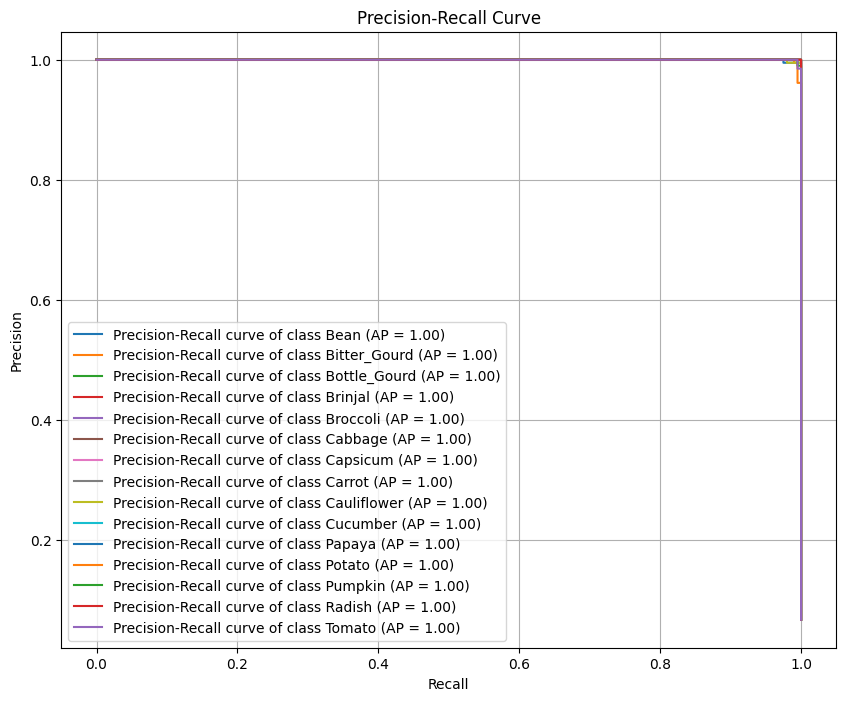

In [ ]:
precision = dict()          # Dictionary untuk menyimpan nilai Precision per kelas
recall = dict()             # Dictionary untuk menyimpan nilai Recall per kelas
average_precision = dict()  # Dictionary untuk menyimpan nilai Average Precision (AP) per kelas

for i in range(n_classes):
    true_one_hot = np.zeros((len(true_labels), n_classes))  
    # Membuat array kosong untuk one-hot encoding
    true_one_hot[np.arange(len(true_labels)), true_labels] = 1  
    # Mengonversi label asli menjadi format one-hot
    
    precision[i], recall[i], _ = precision_recall_curve(true_one_hot[:, i], predictions[:, i])  
    # Menghitung Precision dan Recall untuk kelas ke-i
    average_precision[i] = average_precision_score(true_one_hot[:, i], predictions[:, i])  
    # Menghitung Average Precision (AP) untuk kelas ke-i

plt.figure(figsize=(10, 8))  # Membuat figure baru dengan ukuran 10x8
for i in range(n_classes):
    plt.plot(recall[i], precision[i], 
             label=f'Precision-Recall curve of class {class_labels[i]} (AP = {average_precision[i]:0.2f})')
    # Plot kurva Precision-Recall untuk setiap kelas, menampilkan AP

plt.xlabel('Recall')                 # Label sumbu X
plt.ylabel('Precision')              # Label sumbu Y
plt.title('Precision-Recall Curve')  # Judul grafik
plt.legend(loc="lower left")         # Menampilkan legenda di kiri bawah
plt.grid(True)                       # Mengaktifkan grid
plt.show()                           # Menampilkan grafik


#### Precision-Recall Curve digunakan untuk mengevaluasi performa model pada tiap kelas, terutama saat data tidak seimbang. Kurva yang berada di area atas menunjukkan model mampu menjaga precision dan recall secara konsisten. Nilai Average Precision (AP) semakin mendekati 1 menandakan model semakin baik dalam mengenali kelas tersebut.


## Prediksi Satu Gambar per Kelas

Predicting one image from each class in the test dataset:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


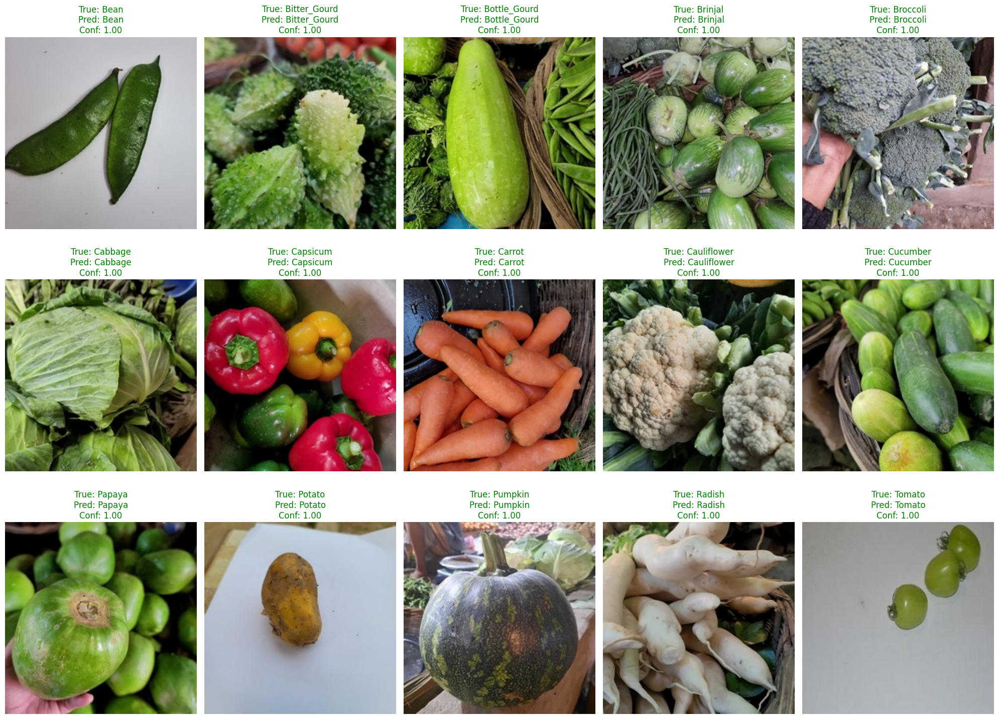

In [ ]:
def predict_one_image_per_class(data_generator, model):
    class_labels = list(data_generator.class_indices.keys())  
    # Mendapatkan nama semua kelas dari data generator
    num_classes = len(class_labels)  
    # Jumlah kelas
    images_predicted = {class_name: False for class_name in class_labels}  
    # Dictionary untuk menandai apakah sudah ada gambar yang diprediksi untuk setiap kelas
    images_to_predict = {}  
    # Menyimpan gambar pertama untuk setiap kelas
    true_labels = {}  
    # Menyimpan label asli untuk setiap kelas

    for images, labels in data_generator:  
        # Iterasi batch dari data generator
        for i in range(images.shape[0]):  
            label_index = np.argmax(labels[i])  
            # Mendapatkan indeks label dari one-hot encoding
            class_name = class_labels[label_index]  
            # Mendapatkan nama kelas

            if not images_predicted[class_name]:  
                # Jika kelas ini belum memiliki gambar yang diprediksi
                images_to_predict[class_name] = images[i]  
                true_labels[class_name] = class_name  
                images_predicted[class_name] = True  
                # Tandai bahwa kelas ini sudah ada gambarnya

        if len(images_to_predict) == num_classes:  
            # Jika sudah mendapatkan satu gambar untuk setiap kelas, hentikan loop
            break

    plt.figure(figsize=(20, 15))  
    # Membuat figure untuk menampilkan gambar
    for i, class_name in enumerate(class_labels):
        if class_name in images_to_predict:  
            # Jika kelas memiliki gambar yang akan diprediksi
            image_to_predict = images_to_predict[class_name]
            image_batch = np.expand_dims(image_to_predict, axis=0)  
            # Menambahkan dimensi batch agar bisa diprediksi oleh model
            prediction = model.predict(image_batch)  
            # Melakukan prediksi
            predicted_label_index = np.argmax(prediction)  
            predicted_class_name = class_labels[predicted_label_index]  
            confidence = np.max(prediction)  
            # Mendapatkan label prediksi dan confidence

            plt.subplot(3, 5, i + 1)  
            # Membuat subplot untuk tiap gambar
            plt.imshow(image_to_predict)  
            # Menampilkan gambar
            title_color = 'green' if true_labels[class_name] == predicted_class_name else 'red'  
            # Warna judul hijau jika prediksi benar, merah jika salah
            plt.title(f"True: {true_labels[class_name]}\nPred: {predicted_class_name}\nConf: {confidence:.2f}", color=title_color)  
            plt.axis('off')  
            # Menonaktifkan axis

    plt.tight_layout()  
    # Mengatur layout agar tidak bertumpuk
    plt.show()  
    # Menampilkan semua gambar dengan prediksi

print("Predicting one image from each class in the test dataset:")  
# Informasi sebelum menampilkan prediksi
predict_one_image_per_class(test_data, model)  
# Memanggil fungsi untuk menampilkan satu gambar per kelas dengan prediksi


#### Menampilkan satu contoh gambar dari setiap kelas pada dataset uji, kemudian model melakukan prediksi terhadap masing-masing gambar. Hasil prediksi ditampilkan bersama label asli dan tingkat kepercayaan (confidence). Judul berwarna hijau menunjukkan prediksi benar, sedangkan warna merah menandakan prediksi salah. Visualisasi ini membantu melihat kemampuan model dalam mengenali tiap kelas secara individual.


## Simpan Model

In [26]:
model.save(f'vegetable_classifier_acc_{accuracy*100:.2f}.h5')

#### Model yang telah dilatih disimpan dalam format .h5 dengan nama file yang menyertakan nilai akurasi pengujian.


In [ ]:
model.save(f'vegetable_classifier_acc_{accuracy*100:.2f}.keras')

#### Model disimpan menggunakan format .keras yang merupakan standar penyimpanan terbaru dari Keras. 


In [ ]:
import json  # Import modul json untuk menyimpan data dalam format JSON

class_indices = train_data.class_indices  
# Mendapatkan mapping kelas ke indeks dari data training

labels = {v: k for k, v in class_indices.items()}  
# Membalik mapping sehingga indeks menjadi key dan nama kelas menjadi value

with open('vegetable_labels.json', 'w') as f:  
    # Membuka file 'vegetable_labels.json' untuk ditulis
    json.dump(labels, f, indent=4)  
    # Menyimpan dictionary labels ke file JSON dengan format yang rapi (indentasi 4)

print("Model labels saved to 'vegetable_labels.json'")  
# Menampilkan pesan bahwa file telah disimpan
print(labels)  
# Menampilkan isi dictionary labels

Model labels saved to 'vegetable_labels.json'
{0: 'Bean', 1: 'Bitter_Gourd', 2: 'Bottle_Gourd', 3: 'Brinjal', 4: 'Broccoli', 5: 'Cabbage', 6: 'Capsicum', 7: 'Carrot', 8: 'Cauliflower', 9: 'Cucumber', 10: 'Papaya', 11: 'Potato', 12: 'Pumpkin', 13: 'Radish', 14: 'Tomato'}


#### Membalik class_indices dari generator data menjadi pasangan `id: nama_kelas` lalu menyimpannya sebagai file `vegetable_labels.json`. 
